<a href="https://colab.research.google.com/github/ab320043/Ahussein-MyRepo/blob/main/AbdallahHussein_5525600_3_image_filtering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Homework 3
1. Upload a personal image in hosting place that can be accesed using an URL.
2. Perform filtering using a 3x3 and then a 5x5 box filter. Show the resulting images. What is the effect of applying a box filter. Explain the differences between the two resulting images.


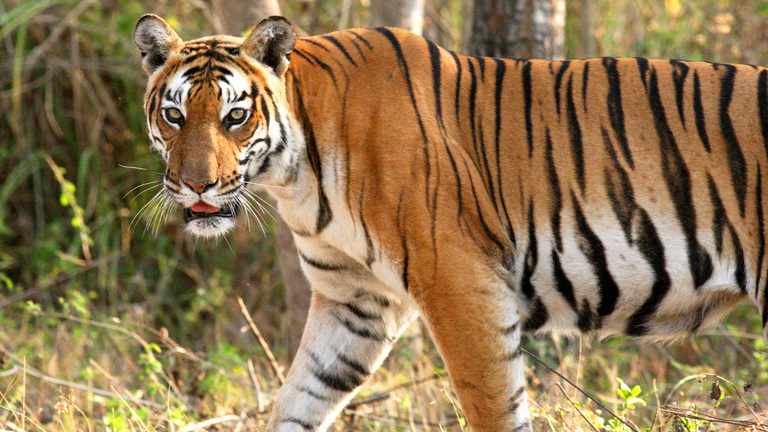

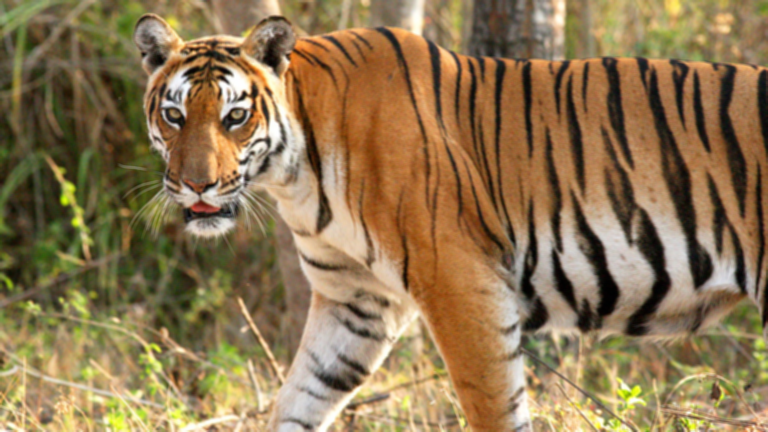

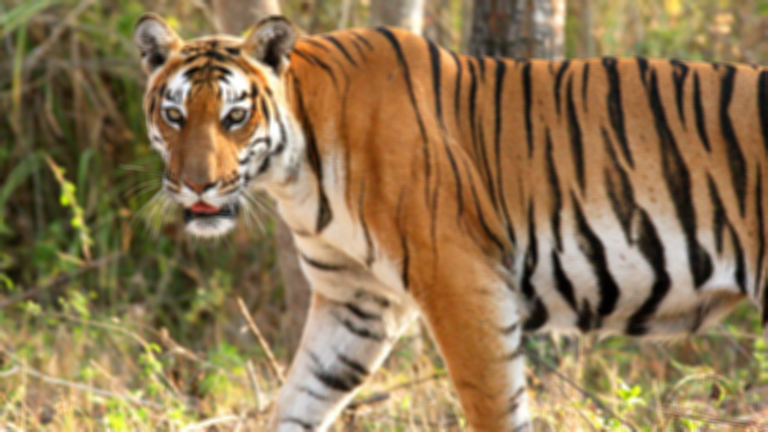

In [1]:
from skimage import io
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load the image
yourUrl = "https://d1jyxxz9imt9yb.cloudfront.net/medialib/5027/image/s768x1300/3_reduced.jpg"
image = io.imread(yourUrl)

# Convert to BGR if using OpenCV
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Prepare the 3x3 and 5x5 box filters
k1 = np.ones((3, 3), np.float32) / 9
k2 = np.ones((5, 5), np.float32) / 25

# Apply the filters
filtered_3x3 = cv2.filter2D(image, -1, k1)
filtered_5x5 = cv2.filter2D(image, -1, k2)

# Visualize the results
cv2_imshow(image)
cv2_imshow(filtered_3x3)
cv2_imshow(filtered_5x5)

3. Obtain and print two-dimensional Gaussian kernels with the following characteristics:<br>
a) $\sigma^2 = 1$, kernel size: 3x3, <br>b) $\sigma^2 = 1.2$, kernel size: 5x5, <br> c) $\sigma^2 = 1.6$, kernel size: 9x9.





3x3 Gaussian Kernel:
 [[0.07511361 0.1238414  0.07511361]
 [0.1238414  0.20417996 0.1238414 ]
 [0.07511361 0.1238414  0.07511361]]
5x5 Gaussian Kernel:
 [[0.00733235 0.02077942 0.02940561 0.02077942 0.00733235]
 [0.02077942 0.05888756 0.08333362 0.05888756 0.02077942]
 [0.02940561 0.08333362 0.11792801 0.08333362 0.02940561]
 [0.02077942 0.05888756 0.08333362 0.05888756 0.02077942]
 [0.00733235 0.02077942 0.02940561 0.02077942 0.00733235]]
9x9 Gaussian Kernel:
 [[0.00012104 0.00047501 0.00126131 0.00226616 0.00275495 0.00226616
  0.00126131 0.00047501 0.00012104]
 [0.00047501 0.00186409 0.00494975 0.00889309 0.01081125 0.00889309
  0.00494975 0.00186409 0.00047501]
 [0.00126131 0.00494975 0.01314314 0.02361394 0.02870725 0.02361394
  0.01314314 0.00494975 0.00126131]
 [0.00226616 0.00889309 0.02361394 0.04242656 0.05157759 0.04242656
  0.02361394 0.00889309 0.00226616]
 [0.00275495 0.01081125 0.02870725 0.05157759 0.0627024  0.05157759
  0.02870725 0.01081125 0.00275495]
 [0.00226616 0

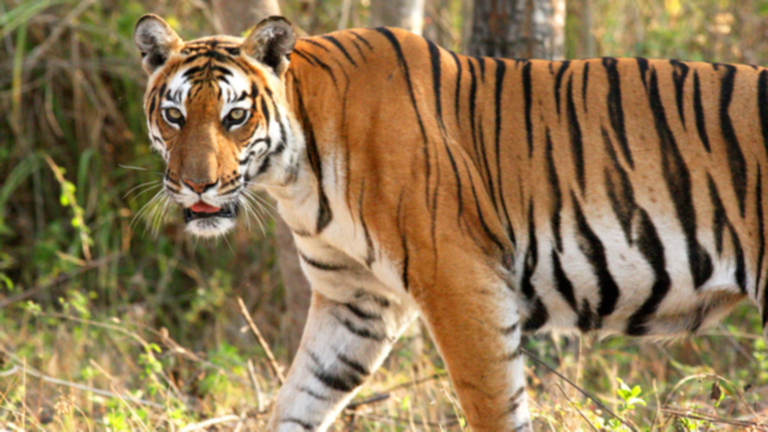

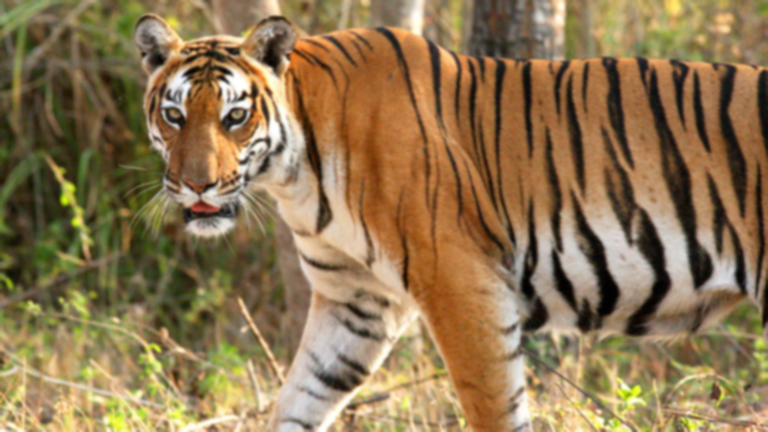

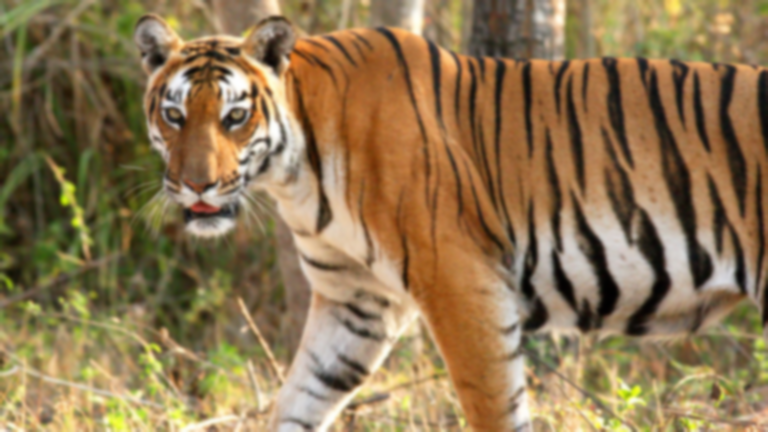

In [3]:
def gkern(l=5, sig=1.):
    ax = np.linspace(-(l - 1) / 2., (l - 1) / 2., l)
    xx, yy = np.meshgrid(ax, ax)
    kernel = np.exp(-0.5 * (np.square(xx) + np.square(yy)) / np.square(sig))
    return kernel / np.sum(kernel)

# Generate Gaussian kernels
# 1 , kernel size: 3x3,
gauss_kernel_3x3 = gkern(3, 1)
# 1.2 , kernel size: 5x5
gauss_kernel_5x5 = gkern(5, 1.2)
# 1.6 , kernel size: 9x9
gauss_kernel_9x9 = gkern(9, 1.6)

print("3x3 Gaussian Kernel:\n", gauss_kernel_3x3)
print("5x5 Gaussian Kernel:\n", gauss_kernel_5x5)
print("9x9 Gaussian Kernel:\n", gauss_kernel_9x9)

# Apply Gaussian filters
gauss_filtered_3x3 = cv2.filter2D(image, -1, gauss_kernel_3x3)
gauss_filtered_5x5 = cv2.filter2D(image, -1, gauss_kernel_5x5)
gauss_filtered_9x9 = cv2.filter2D(image, -1, gauss_kernel_9x9)

# Visualize the results
cv2_imshow(gauss_filtered_3x3)
cv2_imshow(gauss_filtered_5x5)
cv2_imshow(gauss_filtered_9x9)

4. Apply the three
Gaussian kernels obtained previously on your uploaded image. show your filter results. Discuss the differences of
Gaussian operations with different sigmas. Also, compare your results with question 2: what are the differences between these ﬁlters, what do you observe ? Which ﬁltering is the most eﬀective in which images ? Why ?

**My Comment:**

Effect of σ (Sigma):

σ = 1 (3x3 Kernel): This kernel has a small σ, meaning the Gaussian distribution is narrow. It results in mild smoothing, preserving most of the fine details and edges in the image.

σ = 1.2 (5x5 Kernel): A slightly larger σ results in a wider Gaussian distribution. This produces more smoothing compared to the 3x3 kernel, reducing noise and fine details while still preserving major edges.

σ = 1.6 (9x9 Kernel): The largest σ results in a very wide Gaussian distribution. This produces significant smoothing, blurring out most fine details and noise, but also slightly blurring the edges.

Observations:

As σ increases, the image becomes progressively smoother.

Larger kernels (e.g., 9x9) with larger σ values are more effective at reducing noise but may oversmooth the image, losing important details.

Smaller kernels (e.g., 3x3) with smaller σ values preserve more details but are less effective at noise reduction.

Box Filter vs. Gaussian Filter:

Box Filter: The box filter is a simple averaging filter that uniformly weights all pixels in the neighborhood. It is computationally efficient but tends to produce blocky artifacts and does not preserve edges well.

Gaussian Filter: The Gaussian filter weights pixels based on their distance from the center, giving more importance to central pixels. This results in smoother transitions and better edge preservation compared to the box filter.

Differences in Results:

The box filter produces a more uniform blur, which can make edges appear less sharp and introduce artifacts.

The Gaussian filter produces a more natural blur, preserving edges better and reducing noise more effectively.

Effectiveness:

Box Filter: Effective for simple smoothing tasks where computational efficiency is more important than edge preservation.

Gaussian Filter: More effective for tasks requiring noise reduction while preserving edges, such as in medical imaging or high-quality photo editing.




5. Implement the three steps of Sobel filtering. Apply it to the uploaded image for 3 different thresholds. Show the results on
the screen, and discuss the resulting images.



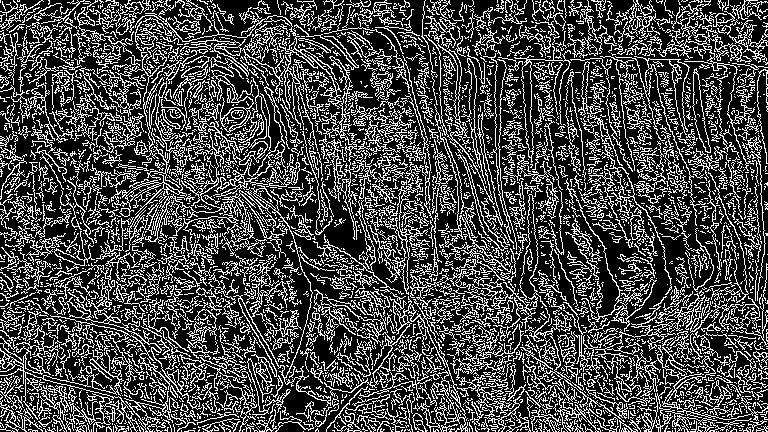

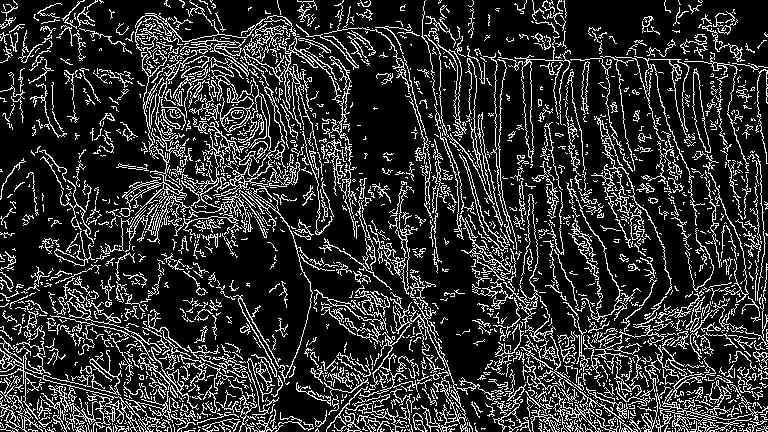

In [4]:
# Canny edge detection with different thresholds
edges1 = cv2.Canny(image, 50, 150)
edges2 = cv2.Canny(image, 100, 200)

cv2_imshow(edges1)
cv2_imshow(edges2)

**My Comment**

Canny Edge Detector: The Canny edge detector uses a multi-stage algorithm to detect a wide range of edges in images. The two thresholds control the hysteresis procedure: the first threshold is used for edge linking, and the second is used for the initial segmentation.

Effect of Thresholds: Lower thresholds will result in more edges being detected, while higher thresholds will result in fewer, but stronger edges.


6. Use canny edge detector incorporated in opencv. Pick two diferent sets of hysteresys thresholds. What can you tell about the effect on the obtained edges.  


A total of 34 grains were found


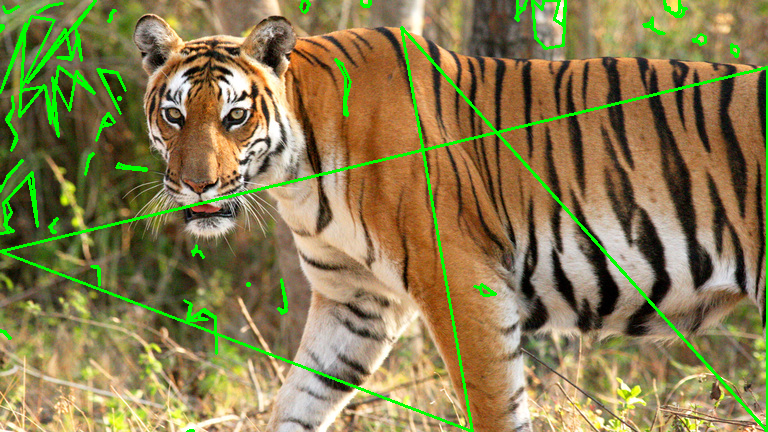

In [6]:
# Read the rice image
rice_image = io.imread('https://d1jyxxz9imt9yb.cloudfront.net/medialib/5027/image/s768x1300/3_reduced.jpg')
rice_image = cv2.cvtColor(rice_image, cv2.COLOR_BGR2RGB)

# Convert to grayscale
gray_rice = cv2.cvtColor(rice_image, cv2.COLOR_BGR2GRAY)

# Apply bilateral filter
gray_rice = cv2.bilateralFilter(gray_rice, 11, 17, 5)

# Canny edge detection
edges_rice = cv2.Canny(gray_rice, 50, 150)

# Apply closing operation
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))
closed_rice = cv2.morphologyEx(edges_rice, cv2.MORPH_CLOSE, kernel)

# Find contours
cnts, _ = cv2.findContours(closed_rice.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Draw contours
for c in cnts:
    peri = cv2.arcLength(c, True)
    approx = cv2.approxPolyDP(c, 0.02 * peri, True)
    cv2.drawContours(rice_image, [approx], -1, (0, 255, 0), 2)

# Display the results
print("A total of " + str(len(cnts)) + " grains were found")
cv2_imshow(rice_image)

**My Comment:**

Bilateral Filter: This filter smooths the image while preserving edges by considering both the spatial distance and the intensity difference.

Canny Edge Detection: Used to detect the edges of the rice grains.

Closing Operation: This operation helps to close small holes in the edges, making the grains more distinct.

Contours: The contours represent the boundaries of the rice grains. The peri variable represents the perimeter of each contour.

Now, you are going to use morphological operations to try to count automatically the number of rice grains from an image.

7. Read image, convert it to gray scale and apply a bilateral filter.
<br>A bilateral filter is a filter that smooth where there is not changes on the gray scale preserving values close to edges. To understand bilateral filters  [Click here](https://machinelearningknowledge.ai/bilateral-filtering-in-python-opencv-with-cv2-bilateralfilter/)


Grayscale Image:


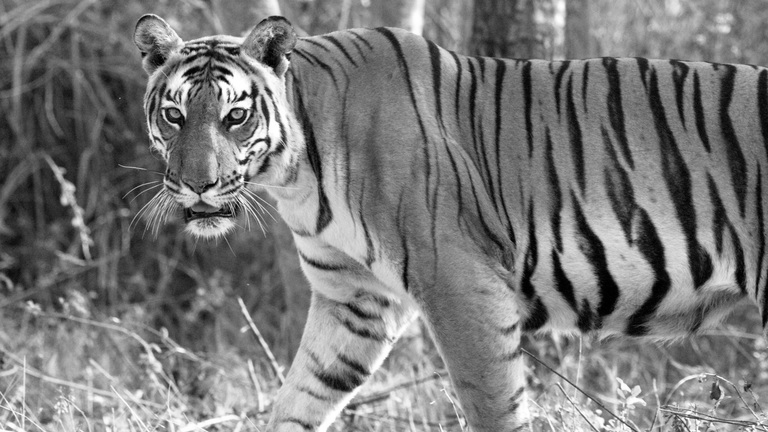

Grayscale Image after Bilateral Filtering:


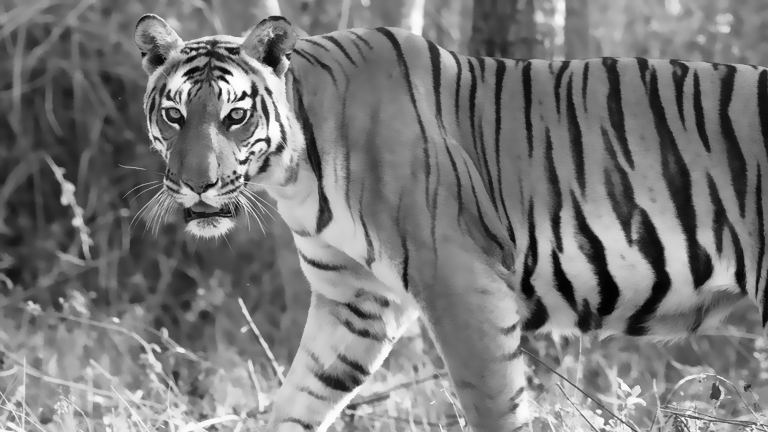

In [7]:
from skimage import io
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Read the image from the provided URL
image_url = "https://d1jyxxz9imt9yb.cloudfront.net/medialib/5027/image/s768x1300/3_reduced.jpg"
image = io.imread(image_url)

# Convert the image from RGB to BGR (if using OpenCV functions)
img = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

# Convert the image to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Display the grayscale image
print("Grayscale Image:")
cv2_imshow(gray)

# Apply a bilateral filter
diameter_neighborhood = 11  # Diameter of the pixel neighborhood
sigma_color_space = 17      # Filter sigma in the color space
sigma_spatial_space = 5     # Filter sigma in the coordinate space

# Apply the bilateral filter
gray_filtered = cv2.bilateralFilter(gray, diameter_neighborhood, sigma_color_space, sigma_spatial_space)

# Display the filtered image
print("Grayscale Image after Bilateral Filtering:")
cv2_imshow(gray_filtered)

8. Compute the edges of the previous image with a Canny filter. Adjust the thresholds of the canny filter to obtain the best edge you can.

Edges Detected by Canny Filter:


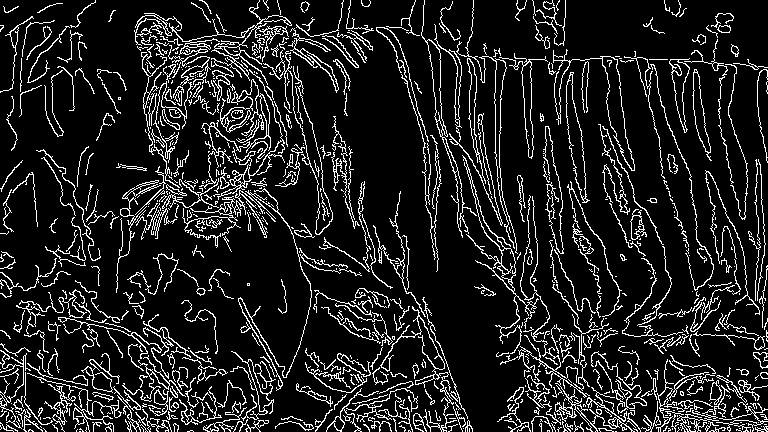

In [8]:
# Apply Canny edge detection
threshold1 = 50  # Lower threshold
threshold2 = 150  # Upper threshold
edges = cv2.Canny(gray_filtered, threshold1, threshold2)

# Display the edges
print("Edges Detected by Canny Filter:")
cv2_imshow(edges)

9. Apply a closing operation to the edges of the image. Experiment with different kernel sizes (3,5,9).


Original Edges:


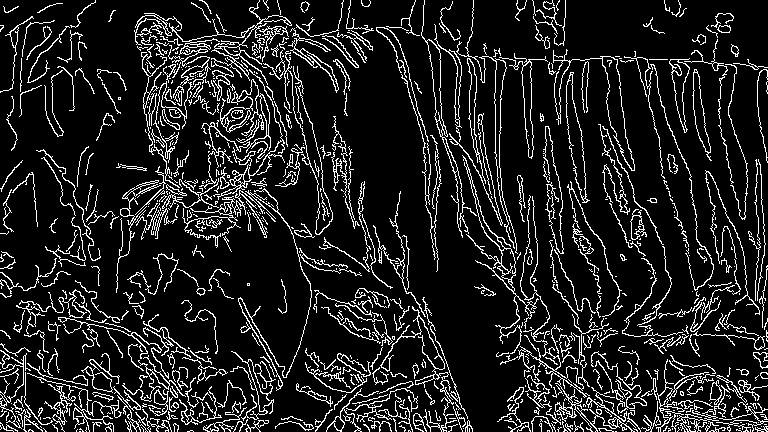

Closed Edges with Kernel Size 3x3:


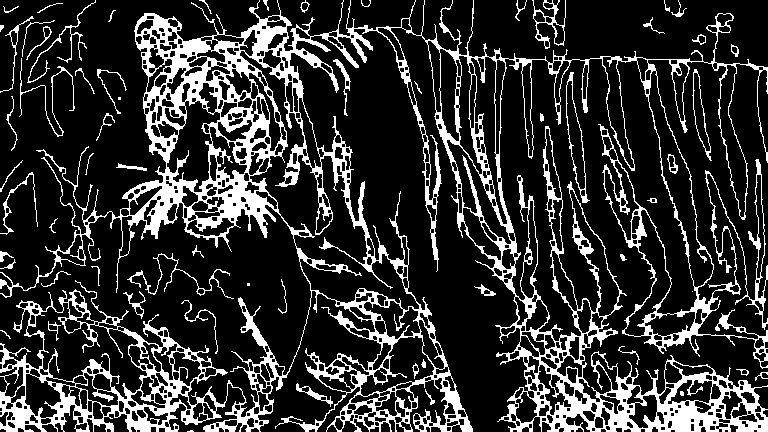

Closed Edges with Kernel Size 5x5:


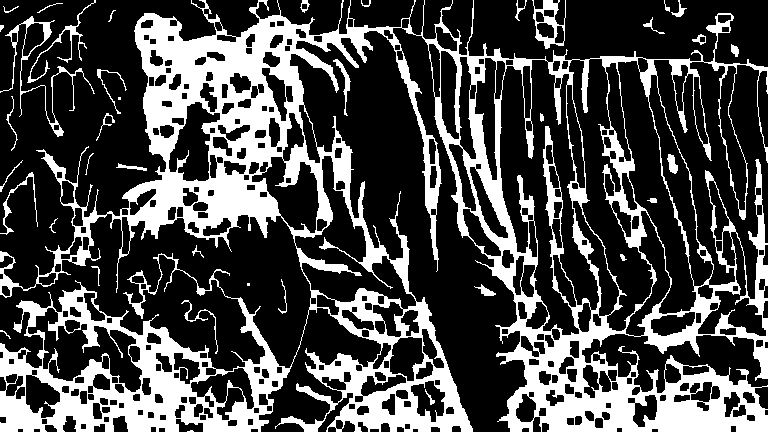

Closed Edges with Kernel Size 9x9:


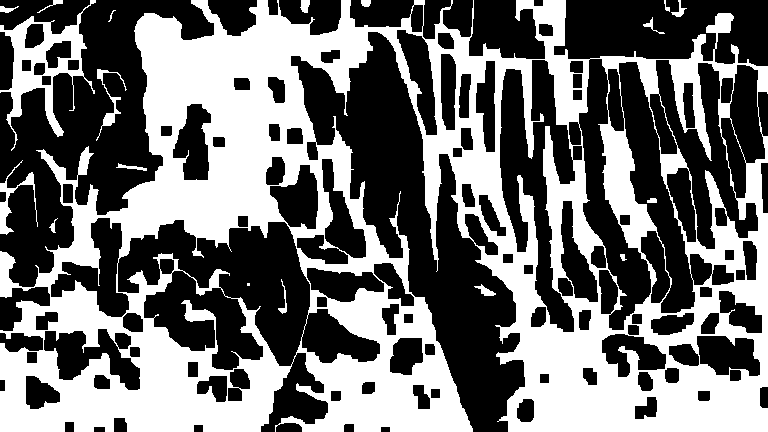

In [10]:
# Apply Canny edge detection (from Step 8)
threshold1 = 50
threshold2 = 150
edges = cv2.Canny(gray_filtered, threshold1, threshold2)

# Display the original edges
print("Original Edges:")
cv2_imshow(edges)

# Define kernel sizes to experiment with
kernel_sizes = [3, 5, 9]

# Apply closing operation with different kernel sizes
for size in kernel_sizes:
    # Create a rectangular kernel
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (size, size))

    # Apply the closing operation
    closed = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)

    # Display the result
    print(f"Closed Edges with Kernel Size {size}x{size}:")
    cv2_imshow(closed)

10. Find the countours (curve joining all the continuous points (along the boundary)) of the object, display the grains you found in the image. Explanation of contours is [here](https://docs.opencv.org/3.4/d4/d73/tutorial_py_contours_begin.html).
<br>
a) what the values of the variable (array) cnts represents? *nts is a list of contours found in the image. Each contour is represented as a NumPy array of (x, y) coordinates of the points along the boundary of the object.*  <br>
b) What the variable "peri" represents? peri represents the perimeter (or arc length) of the contour. It is calculated using cv2.arcLength(c, True), where c is the contour and True indicates that the contour is closed. <br>
c) Change the color of the contour to red? The color of the contours is changed to red by setting the color parameter in cv2.drawContours to (0, 0, 255) (BGR format).

A total of 34 grains were found
Grain 1:


Grain 2:


Grain 3:


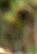

Grain 4:


Grain 5:


Grain 6:


Grain 7:


Grain 8:


Grain 9:


Grain 10:


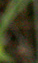

Grain 11:


Grain 12:


Grain 13:


Grain 14:


Grain 15:


Grain 16:


Grain 17:


Grain 18:


Grain 19:


Grain 20:


Grain 21:


Grain 22:


Grain 23:


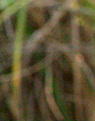

Grain 24:


Grain 25:


Grain 26:


Grain 27:


Grain 28:


Grain 29:


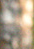

Grain 30:


Grain 31:


Grain 32:


Grain 33:


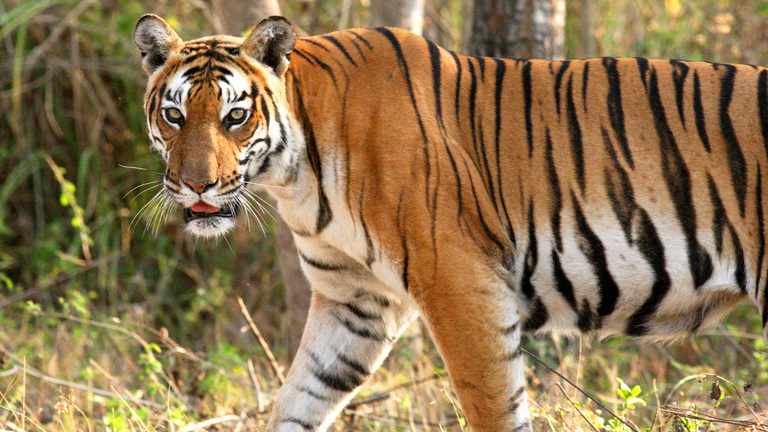

Grain 34:


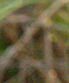

Final Image with Contours:


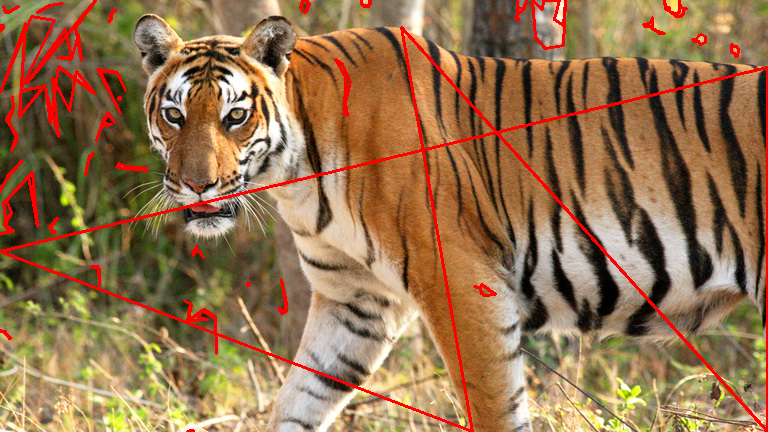

In [11]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Apply Canny edge detection (from Step 8)
threshold1 = 50
threshold2 = 150
edges = cv2.Canny(gray_filtered, threshold1, threshold2)

# Apply closing operation with a 5x5 kernel (from Step 9)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))
closed = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)

# Find contours
cnts, heir = cv2.findContours(closed.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2:]

# Print the number of grains found
print("A total of " + str(len(cnts)) + " grains were found")

# Draw contours on the original image
output_image = img.copy()  # Create a copy of the original image to draw contours
i = 0
for c in cnts:
    # Calculate the perimeter of the contour
    peri = cv2.arcLength(c, True)

    # Approximate the contour to reduce the number of points
    approx = cv2.approxPolyDP(c, 0.02 * peri, True)

    # Draw the contour on the image (in red)
    cv2.drawContours(output_image, [approx], -1, (0, 0, 255), 2)  # Red color: (B, G, R) = (0, 0, 255)

    # Crop the image to show individual grains
    x, y, w, h = cv2.boundingRect(c)
    i += 1
    print(f"Grain {i}:")
    newImage = img[y:y+h, x:x+w]
    cv2_imshow(newImage)

# Display the final image with contours
print("Final Image with Contours:")
cv2_imshow(output_image)